<a href="https://colab.research.google.com/github/fish417913/drone-computer-vision-opencv/blob/main/notebooks/01_drone_image_registration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 1 Summary

## Objective:
Register two overlapping drone images using SIFT feature matching, FLANN nearest-neighbor search, Lowe’s ratio test, RANSAC, and homography estimation.

## Method:
Two adjacent drone images were resized, converted to grayscale, and processed with SIFT to detect keypoints and compute 128-dimensional descriptors. Descriptor matching was performed with FLANN using k=2, and Lowe’s ratio test was applied to remove ambiguous matches. A homography was estimated with RANSAC, and one image was warped into the coordinate system of the other. Registration quality was evaluated using inlier counts, reprojection error, overlay visualization, checkerboard comparison, and residual difference analysis.

## Key results:

**SIFT keypoints detected**: ~19.5k per image

**Ratio-test matches retained**: 369

**RANSAC inliers**: 232

**Inlier ratio**: 62.87%

**Mean reprojection error**: 0.549 pixels

**Median reprojection error**: 0.354 pixels

**Maximum reprojection error**: 3.569 pixels

## Interpretation:
The estimated homography aligned the road region well, but alignment degraded in the forested region. Visual diagnostics showed that inlier matches were concentrated on the road, and residual disagreement remained higher in the forest after registration. This suggests that a single global homography is adequate for approximately planar surfaces but insufficient for areas with significant 3D structure and parallax, such as tree canopy.

## Takeaway:
Global feature-based registration can work well for drone imagery over planar terrain, but spatial match distribution and scene geometry must be evaluated carefully before interpreting residual differences as true scene change.

**Part 1: Get the imagery into Colab**

In [ ]:
!git clone https://github.com/pierotofy/drone_dataset_brighton_beach.git

Cloning into 'drone_dataset_brighton_beach'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 41 (delta 4), reused 7 (delta 1), pack-reused 23 (from 1)
Receiving objects: 100% (41/41), 66.22 MiB | 35.65 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

DATA_DIR = "/content/drone_dataset_brighton_beach/images"

files = sorted(os.listdir(DATA_DIR))

print(f"Number of images: {len(files)}")
print(files)

Number of images: 18
['DJI_0018.JPG', 'DJI_0019.JPG', 'DJI_0020.JPG', 'DJI_0021.JPG', 'DJI_0022.JPG', 'DJI_0023.JPG', 'DJI_0024.JPG', 'DJI_0025.JPG', 'DJI_0026.JPG', 'DJI_0027.JPG', 'DJI_0028.JPG', 'DJI_0029.JPG', 'DJI_0030.JPG', 'DJI_0031.JPG', 'DJI_0032.JPG', 'DJI_0033.JPG', 'DJI_0034.JPG', 'DJI_0035.JPG']


**Part 2: Load two overlapping drone photographs**

In [ ]:
img1_path = os.path.join(DATA_DIR, "DJI_0018.JPG")
img2_path = os.path.join(DATA_DIR, "DJI_0019.JPG")

img1 = cv2.imread(img1_path)
img2 = cv2.imread(img2_path)

print("Image 1:", img1.shape)
print("Image 2:", img2.shape)

Image 1: (2250, 4000, 3)
Image 2: (2250, 4000, 3)


**Part 3: Display them correctly**

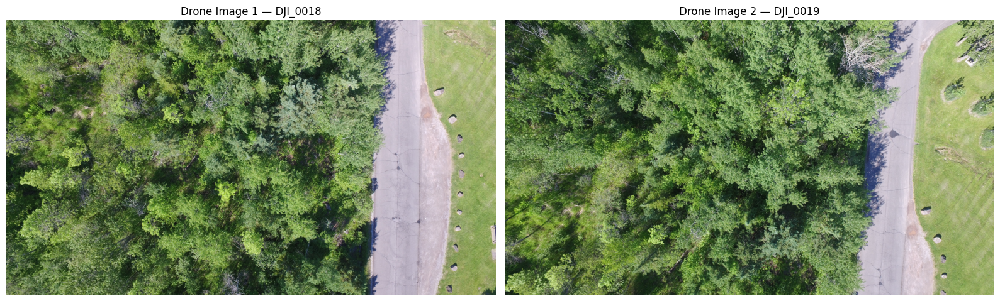

In [ ]:
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

axes[0].imshow(img1_rgb)
axes[0].set_title("Drone Image 1 — DJI_0018")
axes[0].axis("off")

axes[1].imshow(img2_rgb)
axes[1].set_title("Drone Image 2 — DJI_0019")
axes[1].axis("off")

plt.tight_layout()
plt.show()

**Part 4: Resize before doing expensive CV**

In [ ]:
def resize_to_width(image, target_width=1600):
    height, width = image.shape[:2]

    scale = target_width / width
    target_height = int(height * scale)

    resized = cv2.resize(
        image,
        (target_width, target_height),
        interpolation=cv2.INTER_AREA
    )

    return resized

In [ ]:
img1_small = resize_to_width(img1)
img2_small = resize_to_width(img2)

print("Original image 1:", img1.shape)
print("Resized image 1: ", img1_small.shape)

print("Original image 2:", img2.shape)
print("Resized image 2: ", img2_small.shape)

Original image 1: (2250, 4000, 3)
Resized image 1:  (900, 1600, 3)
Original image 2: (2250, 4000, 3)
Resized image 2:  (900, 1600, 3)


**Part 5: Convert to grayscale for SIFT**

In [ ]:
gray1 = cv2.cvtColor(img1_small, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2_small, cv2.COLOR_BGR2GRAY)

print(gray1.shape)
print(gray2.shape)

(900, 1600)
(900, 1600)


**Part 6: Our first actual computer-vision algorithm**

In [ ]:
sift = cv2.SIFT_create()

In [ ]:
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

In [ ]:
print(f"Image 1 keypoints: {len(keypoints1)}")
print(f"Image 2 keypoints: {len(keypoints2)}")

print()
print("Image 1 descriptor matrix:", descriptors1.shape)
print("Image 2 descriptor matrix:", descriptors2.shape)

Image 1 keypoints: 19510
Image 2 keypoints: 19483

Image 1 descriptor matrix: (19510, 128)
Image 2 descriptor matrix: (19483, 128)


**Part 7: Actually look at what SIFT found**

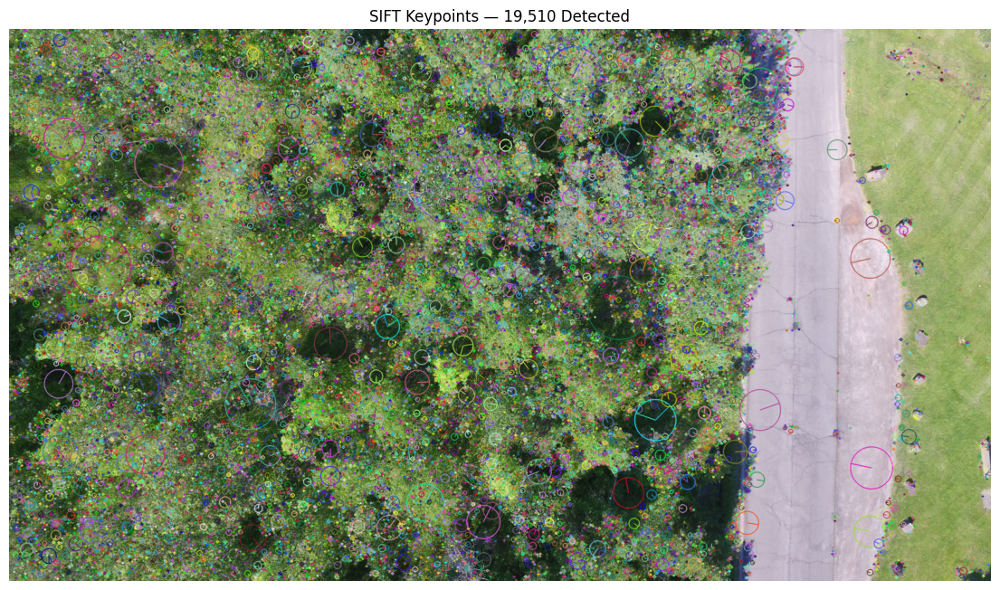

In [ ]:
img1_keypoints = cv2.drawKeypoints(
    img1_small,
    keypoints1,
    None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

img1_keypoints_rgb = cv2.cvtColor(
    img1_keypoints,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 10))
plt.imshow(img1_keypoints_rgb)
plt.title(f"SIFT Keypoints — {len(keypoints1):,} Detected")
plt.axis("off")
plt.show()

**Step 8: Find the two closest matches**

In [ ]:
matcher = cv2.DescriptorMatcher_create(
    cv2.DescriptorMatcher_FLANNBASED
)

knn_matches = matcher.knnMatch(
    descriptors1,
    descriptors2,
    k=2
)

print(f"Number of query descriptors matched: {len(knn_matches)}")

Number of query descriptors matched: 19510


**Step 9: Apply Lowe's ratio test**

In [ ]:
ratio_threshold = 0.75

good_matches = []

for m, n in knn_matches:
    if m.distance < ratio_threshold * n.distance:
        good_matches.append(m)

print(f"Raw matches:  {len(knn_matches)}")
print(f"Good matches: {len(good_matches)}")
print(
    f"Retained:     {len(good_matches) / len(knn_matches) * 100:.2f}%"
)

Raw matches:  19510
Good matches: 369
Retained:     1.89%


**Step 10: Let's look at the match distances**

In [ ]:
distances = np.array([m.distance for m in good_matches])

print(f"Number of good matches: {len(distances)}")
print(f"Minimum distance:       {distances.min():.2f}")
print(f"Median distance:        {np.median(distances):.2f}")
print(f"Mean distance:          {distances.mean():.2f}")
print(f"Maximum distance:       {distances.max():.2f}")

Number of good matches: 369
Minimum distance:       32.37
Median distance:        142.86
Mean distance:          144.17
Maximum distance:       286.90


**Step 11: Draw the proposed matches**

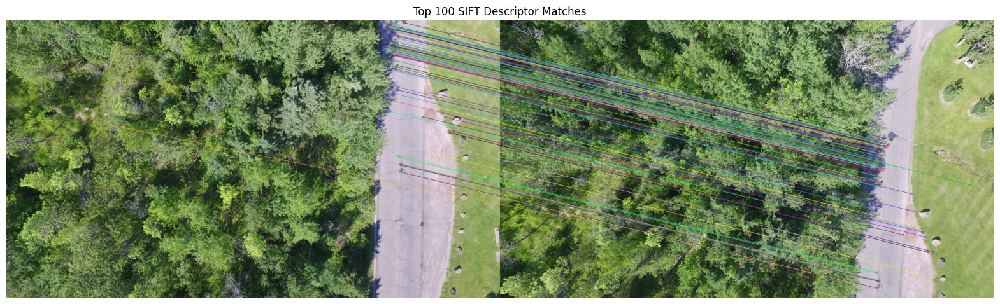

In [ ]:
good_matches_sorted = sorted(
    good_matches,
    key=lambda match: match.distance
)

matches_to_draw = good_matches_sorted[:100]

match_image = cv2.drawMatches(
    img1_small,
    keypoints1,
    img2_small,
    keypoints2,
    matches_to_draw,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

match_image_rgb = cv2.cvtColor(
    match_image,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(20, 12))
plt.imshow(match_image_rgb)
plt.title("Top 100 SIFT Descriptor Matches")
plt.axis("off")
plt.show()

**Step 12: Convert matches into coordinate pairs**

In [ ]:
src_points = np.float32(
    [keypoints1[m.queryIdx].pt for m in good_matches]
).reshape(-1, 1, 2)

dst_points = np.float32(
    [keypoints2[m.trainIdx].pt for m in good_matches]
).reshape(-1, 1, 2)

print("Source points shape:", src_points.shape)
print("Destination points shape:", dst_points.shape)

Source points shape: (369, 1, 2)
Destination points shape: (369, 1, 2)


**Step 13: Estimate the homography with RANSAC**

In [ ]:
H, mask = cv2.findHomography(
    src_points,
    dst_points,
    method=cv2.RANSAC,
    ransacReprojThreshold=5.0
)

print("Homography matrix:")
print(H)

Homography matrix:
[[ 9.97390652e-01 -8.24754856e-02 -9.70780921e+00]
 [ 7.63107395e-02  9.95670828e-01  2.83455949e+02]
 [ 4.23827909e-06 -1.06520464e-05  1.00000000e+00]]


**Step 14: See how many matches RANSAC actually trusted**

In [ ]:
inlier_mask = mask.ravel().astype(bool)

num_inliers = np.sum(inlier_mask)
num_outliers = len(good_matches) - num_inliers
inlier_ratio = num_inliers / len(good_matches)

print(f"Ratio-test matches: {len(good_matches)}")
print(f"RANSAC inliers:     {num_inliers}")
print(f"RANSAC outliers:    {num_outliers}")
print(f"Inlier ratio:       {inlier_ratio * 100:.2f}%")

Ratio-test matches: 369
RANSAC inliers:     232
RANSAC outliers:    137
Inlier ratio:       62.87%


**Step 15: Visualize only the RANSAC inliers**

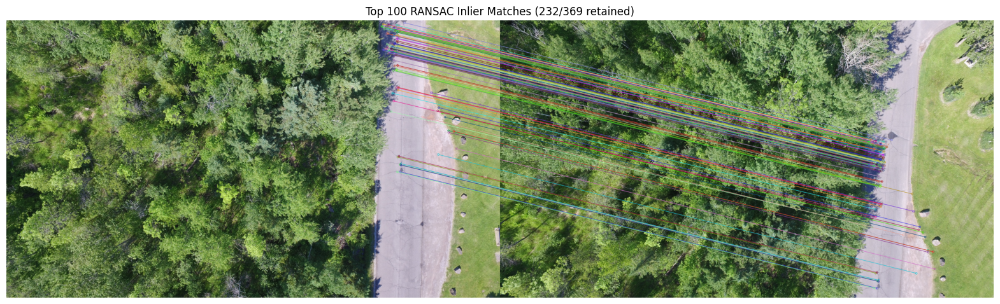

In [ ]:
inlier_matches = [
    match
    for match, is_inlier in zip(good_matches, inlier_mask)
    if is_inlier
]

inlier_matches_sorted = sorted(
    inlier_matches,
    key=lambda match: match.distance
)

matches_to_draw = inlier_matches_sorted[:100]

ransac_match_image = cv2.drawMatches(
    img1_small,
    keypoints1,
    img2_small,
    keypoints2,
    matches_to_draw,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

ransac_match_image_rgb = cv2.cvtColor(
    ransac_match_image,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(20, 12))
plt.imshow(ransac_match_image_rgb)
plt.title(
    f"Top 100 RANSAC Inlier Matches "
    f"({num_inliers}/{len(good_matches)} retained)"
)
plt.axis("off")
plt.show()

**Step 16: Look at spatial coverage**

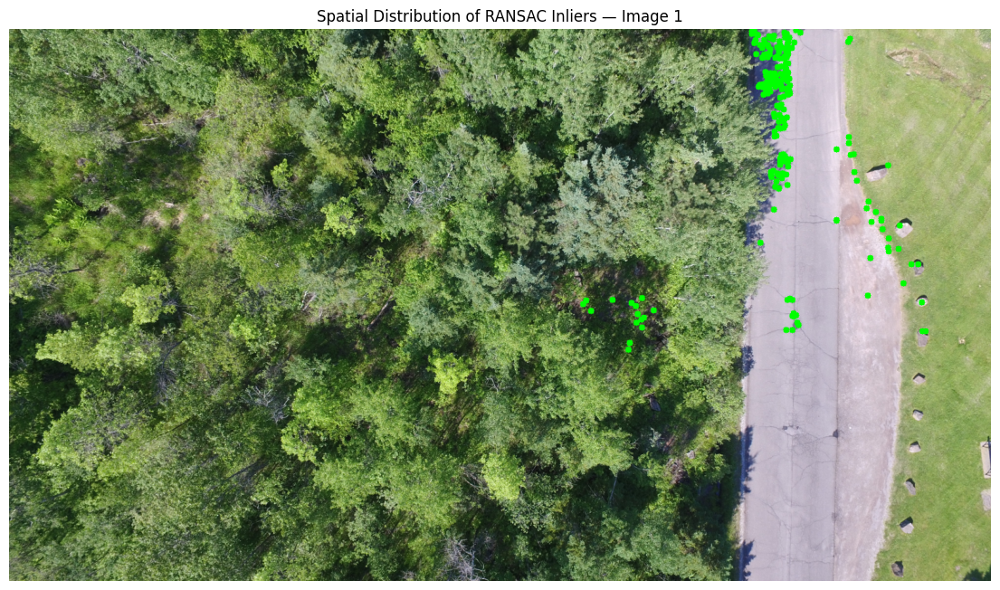

In [ ]:
img1_inliers = img1_small.copy()

for match in inlier_matches:
    x, y = keypoints1[match.queryIdx].pt

    cv2.circle(
        img1_inliers,
        (int(x), int(y)),
        radius=5,
        color=(0, 255, 0),
        thickness=-1
    )

img1_inliers_rgb = cv2.cvtColor(
    img1_inliers,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 10))
plt.imshow(img1_inliers_rgb)
plt.title("Spatial Distribution of RANSAC Inliers — Image 1")
plt.axis("off")
plt.show()

**Step 17: Warp Image 1**

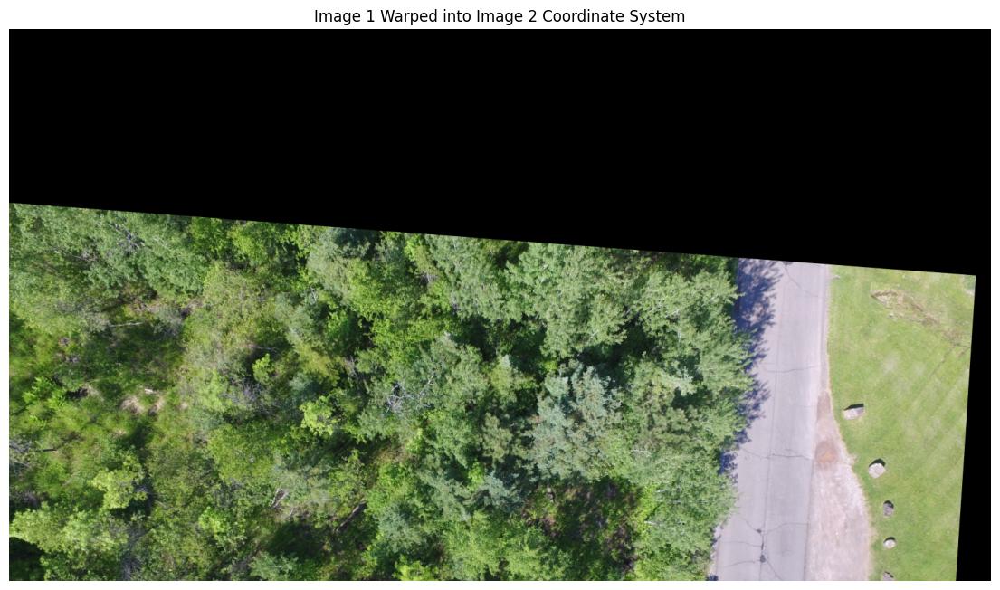

In [ ]:
height2, width2 = img2_small.shape[:2]

img1_warped = cv2.warpPerspective(
    img1_small,
    H,
    (width2, height2)
)

img1_warped_rgb = cv2.cvtColor(
    img1_warped,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 10))
plt.imshow(img1_warped_rgb)
plt.title("Image 1 Warped into Image 2 Coordinate System")
plt.axis("off")
plt.show()

**Step 18: Compare warped Image 1 with Image 2**

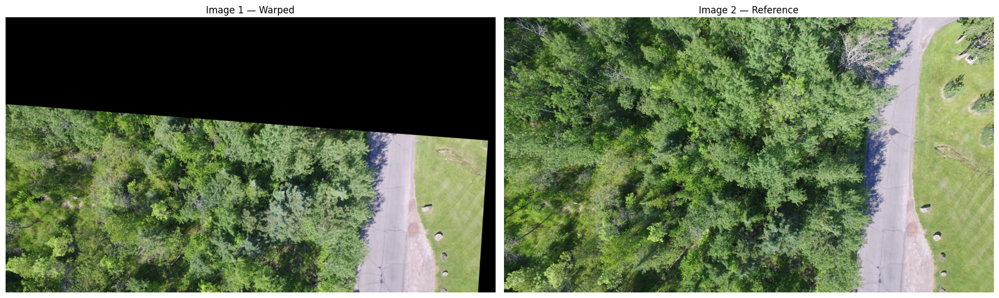

In [ ]:
img2_small_rgb = cv2.cvtColor(
    img2_small,
    cv2.COLOR_BGR2RGB
)

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

axes[0].imshow(img1_warped_rgb)
axes[0].set_title("Image 1 — Warped")
axes[0].axis("off")

axes[1].imshow(img2_small_rgb)
axes[1].set_title("Image 2 — Reference")
axes[1].axis("off")

plt.tight_layout()
plt.show()

**Step 19: Alpha-blend them**

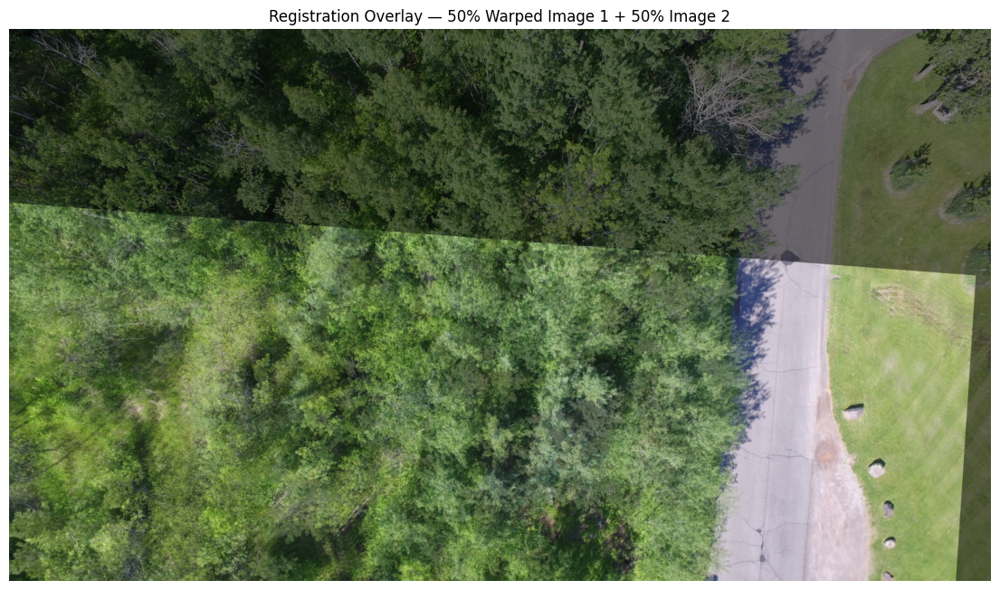

In [ ]:
overlay = cv2.addWeighted(
    img1_warped,
    0.5,
    img2_small,
    0.5,
    0
)

overlay_rgb = cv2.cvtColor(
    overlay,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 10))
plt.imshow(overlay_rgb)
plt.title("Registration Overlay — 50% Warped Image 1 + 50% Image 2")
plt.axis("off")
plt.show()

**Step 20: Make the comparison even easier**

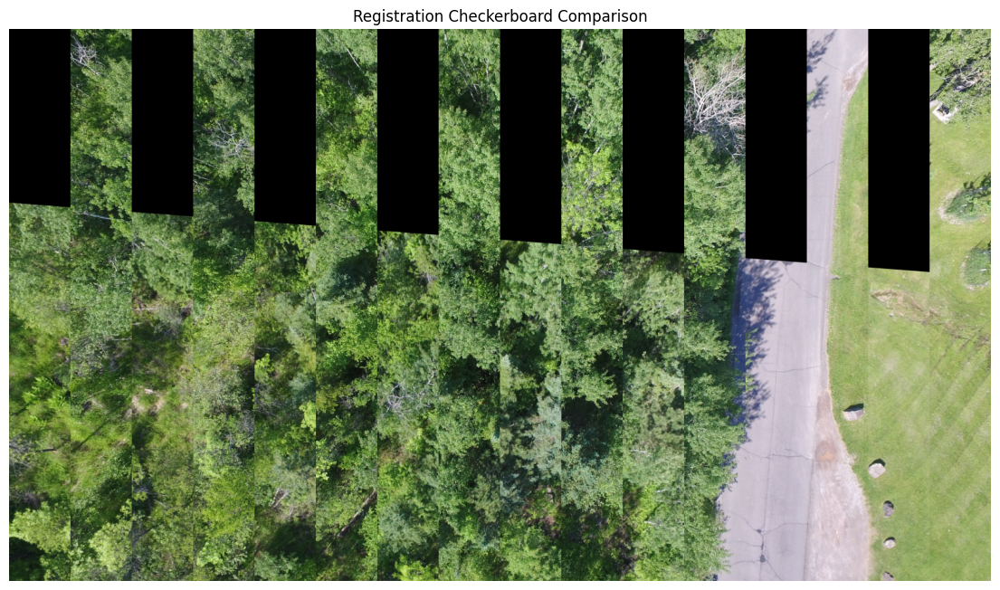

In [ ]:
checkerboard = img2_small.copy()

strip_width = 100

for x in range(0, width2, strip_width * 2):
    checkerboard[:, x:x + strip_width] = \
        img1_warped[:, x:x + strip_width]

checkerboard_rgb = cv2.cvtColor(
    checkerboard,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 10))
plt.imshow(checkerboard_rgb)
plt.title("Registration Checkerboard Comparison")
plt.axis("off")
plt.show()

**Step 21: Quantify RANSAC's geometric accuracy**

In [ ]:
src_inliers = src_points[inlier_mask]
dst_inliers = dst_points[inlier_mask]

projected_points = cv2.perspectiveTransform(
    src_inliers,
    H
)

errors = np.linalg.norm(
    projected_points.reshape(-1, 2)
    - dst_inliers.reshape(-1, 2),
    axis=1
)

print(f"Mean reprojection error:   {errors.mean():.3f} pixels")
print(f"Median reprojection error: {np.median(errors):.3f} pixels")
print(f"Maximum reprojection error:{errors.max():.3f} pixels")

Mean reprojection error:   0.549 pixels
Median reprojection error: 0.354 pixels
Maximum reprojection error:3.569 pixels


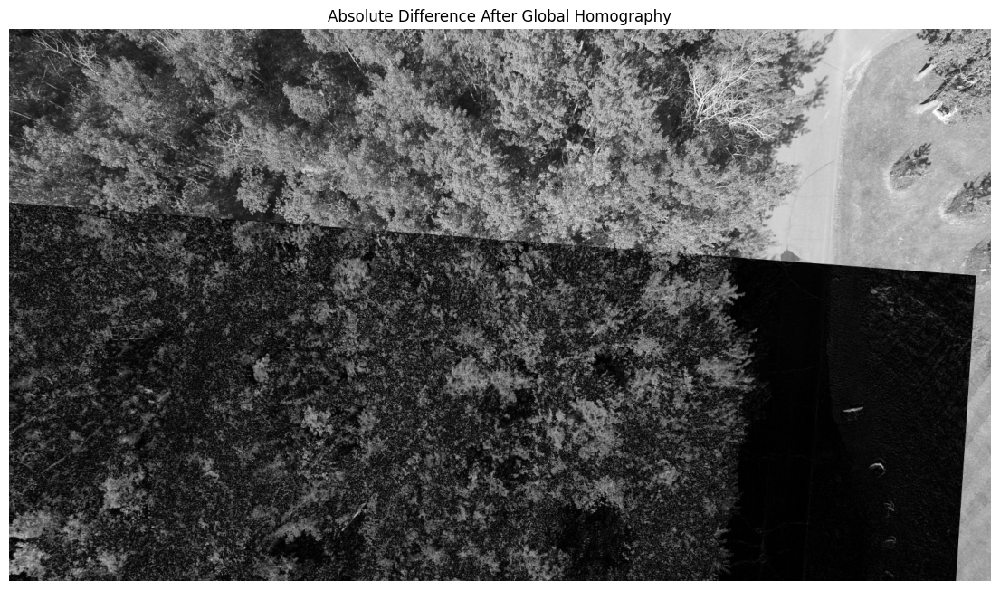

In [ ]:
gray1_warped = cv2.cvtColor(
    img1_warped,
    cv2.COLOR_BGR2GRAY
)

gray2_small = cv2.cvtColor(
    img2_small,
    cv2.COLOR_BGR2GRAY
)

difference = cv2.absdiff(
    gray1_warped,
    gray2_small
)

plt.figure(figsize=(14, 10))
plt.imshow(difference, cmap="gray")
plt.title("Absolute Difference After Global Homography")
plt.axis("off")
plt.show()

**Step 22: Create a valid overlap mask**

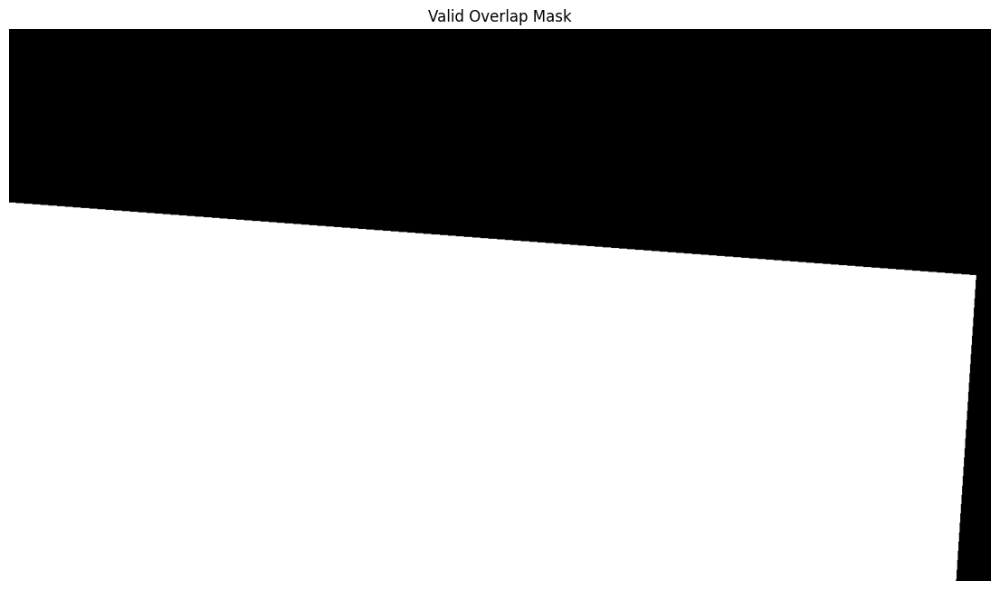

In [ ]:
mask1 = np.ones(gray1.shape, dtype=np.uint8) * 255

mask1_warped = cv2.warpPerspective(
    mask1,
    H,
    (width2, height2)
)

valid_overlap = mask1_warped > 0

plt.figure(figsize=(14, 10))
plt.imshow(valid_overlap, cmap="gray")
plt.title("Valid Overlap Mask")
plt.axis("off")
plt.show()

**Step 23: Recompute residual only in the overlap area**

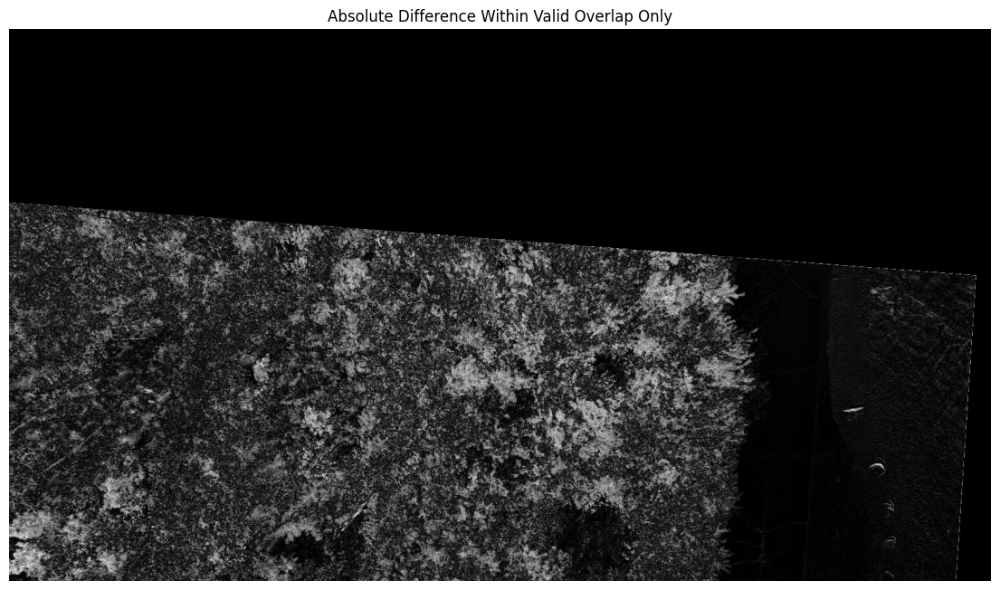

In [ ]:
masked_difference = np.zeros_like(difference)
masked_difference[valid_overlap] = difference[valid_overlap]

plt.figure(figsize=(14, 10))
plt.imshow(masked_difference, cmap="gray")
plt.title("Absolute Difference Within Valid Overlap Only")
plt.axis("off")
plt.show()

**Step 24: Quantify the residuals in the overlap**

In [ ]:
overlap_values = difference[valid_overlap]

print(f"Overlap pixel count: {overlap_values.size}")
print(f"Mean overlap residual:   {overlap_values.mean():.3f}")
print(f"Median overlap residual: {np.median(overlap_values):.3f}")
print(f"Max overlap residual:    {overlap_values.max():.3f}")

Overlap pixel count: 869685
Mean overlap residual:   38.469
Median overlap residual: 27.000
Max overlap residual:    208.000


**Step 25: Compare road-like and forest-like regions qualitatively**

Residual disagreement after global homography was low along the road surface, but substantially higher in forested areas. This indicates that the estimated homography aligns planar ground surfaces effectively, while elevated vegetation and canopy structure violate the assumptions of a single global projective transformation.